# ESiWACE3 Compression Lab in WebAssembly

**Note:** Any changes you make to this notebook will be lost once the page is closed or refreshed. Please download any files you would like to keep.

**Note:** The WASM-based version of the compression lab running inside JupyterLite has only been tested in recent Firefox browsers.

## Import the ESiWACE3 field compression benchmarking library

Importing `fcbench` also imports a large number of dependencies, which may take around a minute. Why not use this time to grab a drink, stretch your legs, and look out of your window?

In [4]:
import fcbench

Many Python packages that are common in scientific computing and meteorology are available in this lab and can simply be imported. These include, e.g., `cartopy`, `cfgrib`, `dask`, `earthkit`, `matplotlib`, `metpy`, `netcdf4`, `numcodecs`, `numpy`, `pandas`, `xarray`, and `zarr`.

If you want to use a package that fails to import, you can first try to install it from PyPi by running a code cell similar to the following, which installs `tqdm`:

In [5]:
%pip install tqdm
import tqdm

Note that this installation only works for *pure* Python packages, i.e. those that only include Python code and only have pure or pre-installed dependencies. If you cannot install your packages this way, please tell us about the missing package in the feedback form below:

https://forms.office.com/e/hKqfmvFTkz

## Fetch an example dataset

We use `xarray` to load datasets into this laboratory. Since the lab might run in memory constrained environments, we configure `dask` to use a small chunk size so that even large datasets can be streamed efficiently.

In [6]:
from pathlib import Path
import dask

dask.config.set(array__chunk_size="32MiB");

The `utils.py` file next to this notebook defines several helper functions to conveniently load datasets from different sources.

In [7]:
# TODO: remove this code
import pyodide_js
with open("utils.py") as up:
    await pyodide_js.loadPackagesFromImports(up.read())
import utils

First, we look at temperature and specific humidity in one control forecast from the Ensemble Prediction System, which we retrieve with the following MARS request:
```retrieve,
class=od,
date=2024-08-15,
expver=1,
levelist=2,
levtype=ml,
param=130/133,
step=360,
stream=enfo,
time=00:00:00,
type=cf,
target="output"
```

[This](https://apps.ecmwf.int/mars-catalogue/selectors/grib2netcdf/213960/)  is the link to the MARS archive, and the data is also available [here](https://faubox.rrze.uni-erlangen.de/dl/fiF7GY8jejfyr1ztNyxZj/_grib2netcdf-bol-webmars-private-svc-blue-002-d4755d5b313f7cded016e66ba0cd989b-Fa3z8n.nc). 

Currently, reading in the data here works only in netCDF format, so please download it in netCDF format and upload it in the next cell.

### Option 1: Download a small dataset into memory

Small datasets can be downloaded and saved in the in-memory file system of this JupyterLite notebook. Note, however, that memory is limited. Currently ther is still an error `BadStatusLine: HTTP/1.1 0`, therefore the following is commented out.

In [8]:
#import shutil
#from pathlib import Path
#from urllib.parse import quote as urlquote, unquote as urlunquote
#from urllib.parse import urlparse

#small_url = "https://faubox.rrze.uni-erlangen.de/dl/fiF7GY8jejfyr1ztNyxZj/_grib2netcdf-bol-webmars-private-svc-blue-002-d4755d5b313f7cded016e66ba0cd989b-Fa3z8n.nc"
#small_path = Path(urlunquote(Path(urlparse(small_url).path).name))
#small_url = "https://corsproxy.io/?" + urlquote(small_url)

#with urlopen(small_url) as response:
#    with small_path.open("wb") as file:
#        shutil.copyfileobj(response, file)

### Option 2: Mount a large dataset from the user's filesystem

You can upload a dataset file from your own computer. The file is mounted in read-only mode into the notebook's file system without reading the file into memory, thus allowing arbitrarily large files to be made accessible. It is worth remembering that large files can still only be read if the algorithm that processes them supports streaming or chunking and does not request to load all data into memory at the same time.

If this notebook is run inside JupyterLite, the file also never leaves your own computer.

Currently, reading in the data here works only in netCDF format, so please download it in netCDF format and upload it in the next cell.


In [9]:
 upload_path = await utils.mount_user_local_file()
 upload_path

FileUploadLite(value=(), description='Upload')

PosixPath('/uploads/6e4c0364-d6c3-46dc-a2e8-26fc4b0118f9/_grib2netcdf-bol-webmars-private-svc-blue-002-d4755d5b313f7cded016e66ba0cd989b-Fa3z8n.nc')

Once you have selected a file to upload, you can retrieve the path at which the file is now mounted in read-only mode.

## Load the example dataset into `xarray`

To select which dataset you wish to load, execute the following three lines.

Afterwards, we load the dataset into `xarray`.
```python
utils.open_dataset(path: pathlib.Path, **kwargs) -> xarray.Dataset
```
is a thin wrapper around
```python
xarray.open_dataset(filename: str, **kwargs) -> xarray.Datset
```
and thus takes the same arguments. Please refer to the [`xarray.open_dataset`](https://docs.xarray.dev/en/stable/generated/xarray.open_dataset.html) documentation if you need to perform some special configuration.

In [10]:
import xarray as xr

dataset_path = upload_path

ds = utils.open_dataset(dataset_path)
ds

<xarray.Dataset>
Dimensions:    (longitude: 360, latitude: 181, time: 1)
Coordinates:
  * longitude  (longitude) float32 0.0 1.0 2.0 3.0 ... 356.0 357.0 358.0 359.0
  * latitude   (latitude) float32 90.0 89.0 88.0 87.0 ... -88.0 -89.0 -90.0
  * time       (time) datetime64[ns] 2024-08-30
Data variables:
    t          (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
    q          (time, latitude, longitude) float32 dask.array<chunksize=(1, 181, 360), meta=np.ndarray>
Attributes:
    Conventions:  CF-1.6
    history:      2024-08-15 13:11:52 GMT by grib_to_netcdf-2.35.3: /opt/ecmw...
    path:         /uploads/6e4c0364-d6c3-46dc-a2e8-26fc4b0118f9/_grib2netcdf-...

## Plot the loaded dataset

In [11]:
import earthkit

/lib/python3.11/site-packages/earthkit/regrid/utils/caching.py:27: UserWarning: only soft file lock is available
  from filelock import FileLock


We first plot the loaded dataset. `earthkit` provides the
```python
earthkit.maps.quickplot(
    *data, blueprint=..., units=None, style=None, disjoint=False, show=True, **kwargs
) -> matplotlib.figure.Figure
```
helper function to plot weather and climate maps data.

In our example, we plot the specific humidity variable `q` on the first hybrid layer from the dataset.

In [12]:
da = []
da.append(ds["q"])
da.append(ds["t"])

In [13]:
def plot_data(data):
    for i, d in enumerate(da):
        if d.name == 't':
            style = earthkit.maps.Style(
                levels=earthkit.maps.styles.levels.auto_range(data[d.name], n_levels=256),
                )
        elif d.name == 'q':
            style = earthkit.maps.Style(
                colors="viridis",
                levels=earthkit.maps.styles.levels.auto_range(data[d.name], n_levels=256),
            )
        earthkit.maps.quickplot(data[d.name], style=style);

/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_physical/ne_110m_coastline.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/110m_cultural/ne_110m_admin_0_boundary_lines_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


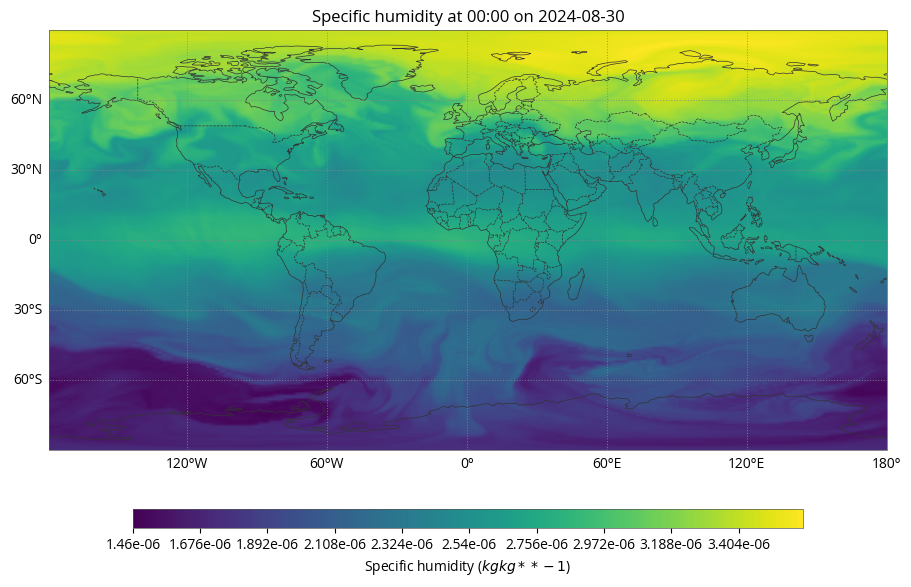

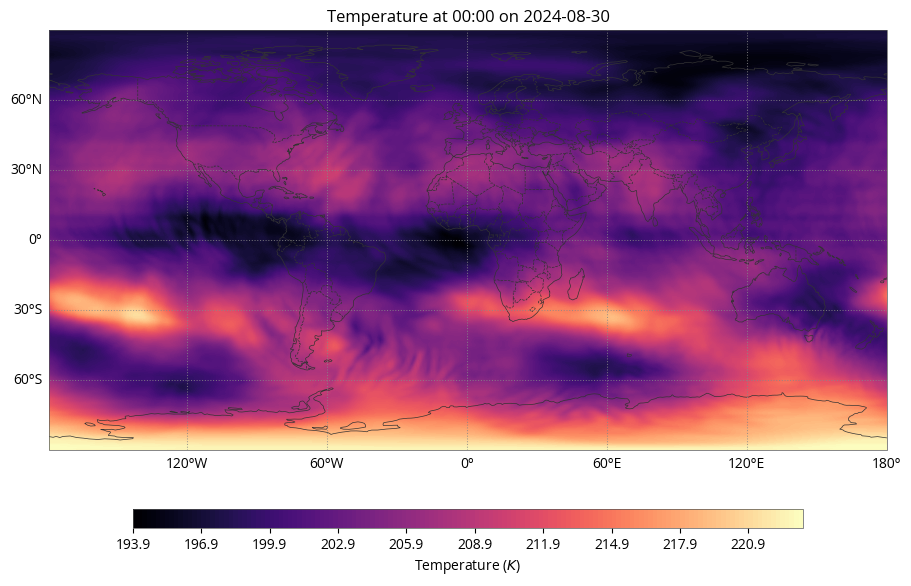

In [14]:
da_dict = {}
for i, d in enumerate(da):
    da_dict[da[i].name] = d
plot_data(da_dict)

## Comparing several different compression methods

`fcbench` provides some helper functions to compress your data with codecs implementing the `numcodecs` API. `fcbench.codecs` also comes with built-in support for several compression codecs, which we first have to preload.

In [15]:
fcbench.codecs.preload()

Loaded the fcbench.codecs.BitRound codec ...
Loaded the fcbench.codecs.BitTranspose codec ...
Loaded the fcbench.codecs.Identity codec ...
Loaded the fcbench.codecs.LinearQuantize codec ...
Loaded the fcbench.codecs.Log codec ...
Loaded the fcbench.codecs.Reinterpret codec ...
Loaded the fcbench.codecs.Round codec ...
Loaded the fcbench.codecs.Sz3 codec ...
Loaded the fcbench.codecs.UniformNoise codec ...
Loaded the fcbench.codecs.Zfp codec ...
Loaded the fcbench.codecs.Zlib codec ...
Loaded the fcbench.codecs.Zstd codec ...


## Run a simple Linear Quantization compressor

One of the codecs included in `fcbench.codecs` is the simple lossy `LinearQuantize` codec that rescales real-valued data from $[min; max]$ to the integer range $[0; 2^b - 1]$. Here, $b$ is the number of bit precision you want to keep.

In [16]:
simple_compressor = []
da_simple = {}
stats_simple = {}

for i, d in enumerate(da):
    simple_compressor.append([fcbench.codecs.LinearQuantize(bits=4, dtype=str(d.dtype))])
    da_simple[d.name], stats_simple[d.name] = fcbench.compressor.compute_dataarray_compress_decompress(d, simple_compressor[i])
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats([simple_compressor[i]], stats_simple[d.name]))
# Todo use Log (error now only positive)

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"[LinearQuantize(dtype='float32', bits=4)]",4.0,0.05,0.19,6.4,2.0


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"[LinearQuantize(dtype='float32', bits=4)]",4.0,0.09,0.26,6.4,2.0


After you have finished using a compressor, it is important to overwrite or delete it to allow its resources to be reused.

In [17]:
del simple_compressor

When we plot the compressed data, we can see that it has indeed been quantized to $2^4 = 16$ values (per data chunk).

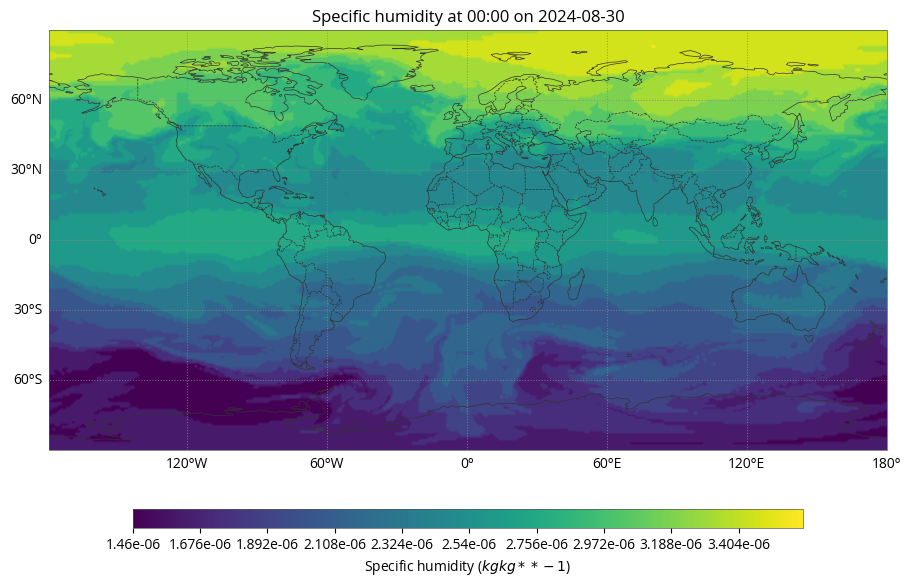

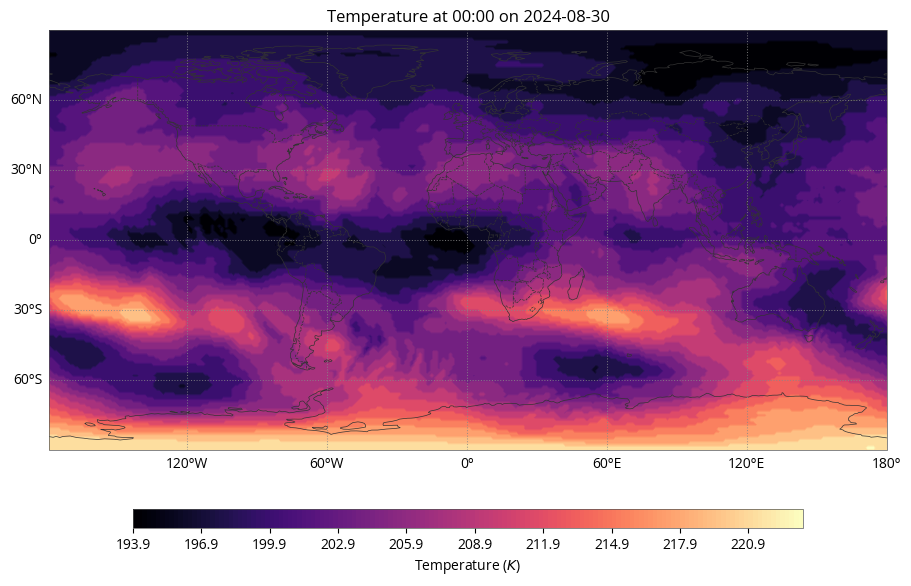

In [18]:
plot_data(da_simple)

## Plot the simple compression error

The following is a helper function to compute the different relative errors.

In [19]:
import numpy as np
def compute_relative_errors(da_compressed, da):
    da_error = da_compressed - da

    norm_L1_error = np.abs(da_error).sum().values
    norm_L2_error = np.sqrt((da_error**2).sum().values)
    norm_Linf_error = np.abs(da_error).max().values

    norm_L1_original = np.abs(da).sum().values
    norm_L2_original = np.sqrt((da**2).sum().values)
    norm_Linf_original = np.abs(da).max().values

    relative_error_L1 = norm_L1_error / norm_L1_original
    relative_error_L2 = norm_L2_error / norm_L2_original
    relative_error_Linf = norm_Linf_error / norm_Linf_original

    return {
        "Relative_Error_L1": relative_error_L1,
        "Relative_Error_L2": relative_error_L2,
        "Relative_Error_Linf": relative_error_Linf
    }

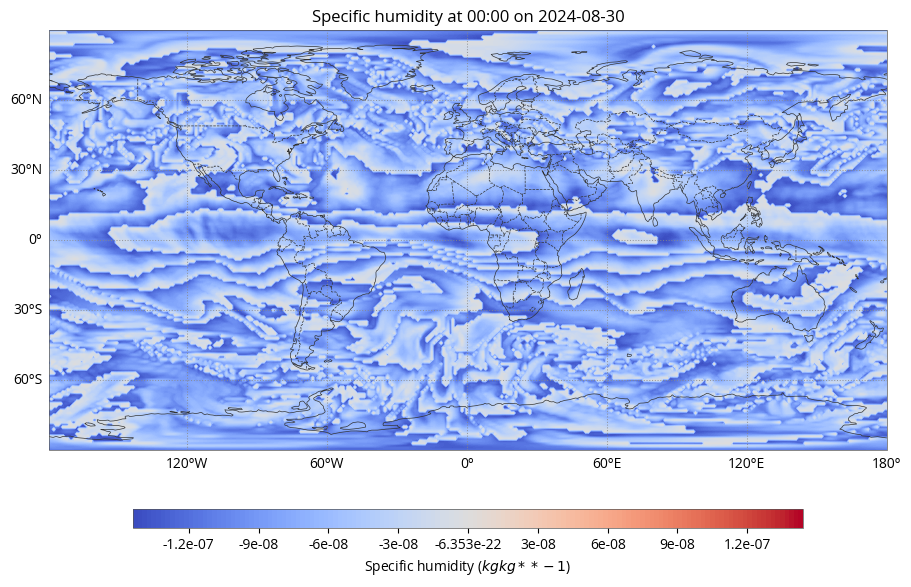

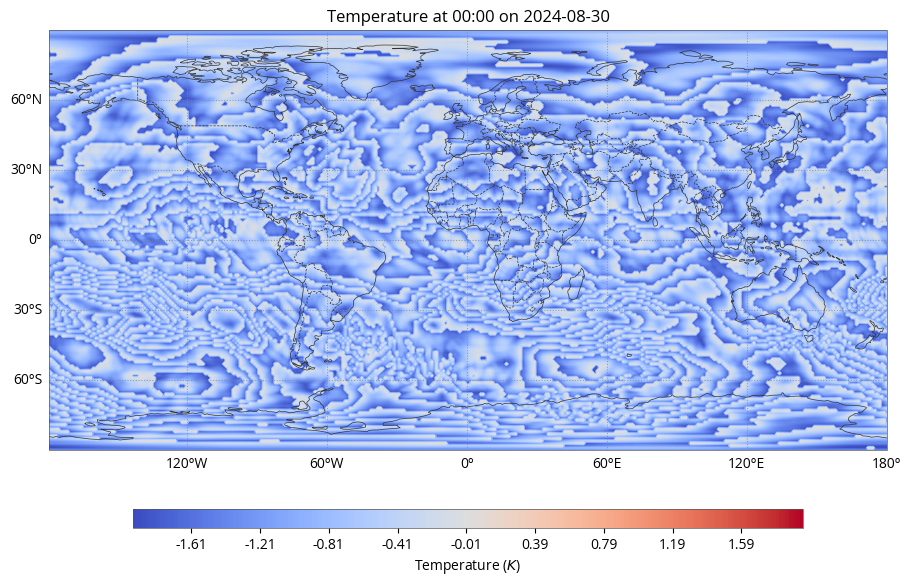

In [20]:
errors_simple = {}
da_simple_error = []
for i, d in enumerate(da):
    errors_simple[d.name] = compute_relative_errors(da_simple[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_simple_error = da_simple[d.name] - da[i]
    earthkit.maps.quickplot(da_simple_error, style=earthkit.maps.Style(
    colors="coolwarm",
    levels=earthkit.maps.styles.levels.auto_range(da_simple_error, n_levels=256, divergence_point=0.0),

));
    


## Run the transform-based ZFP compressor

ZFP is a lossy transform-based compressor that compresses multidimensional data in $4^d$ chunks where $d$ is the dimensionality of the data. All values in the chunk are decorrelated and then transformed into a binary plane embedding that is roughly ordered by importance. The resulting per-chunk bitstream can be truncated to satisfy a user-provided compression target, e.g. a fixed number of bits, a bitplane precision, or an absolute error tolerance.

You can find out more about the ZFP compressor in its [documentation](https://zfp.readthedocs.io/en/latest/index.html) and the following two publications:

> Diffenderfer, J. et *al*. (2019). Error Analysis of ZFP Compression for Floating-Point Data. *SIAM Journal on Scientific Computing*. 41(3). pp. A1867-A1898. Available from: [doi:10.1137/18M1168832](https://doi.org/10.1137/18M1168832).

> Lindstrom, P. (2014). Fixed-Rate Compressed Floating-Point Arrays. *IEEE Transactions on Visualization and Computer Graphics*. 20(2). pp. 2674-2683. Available from: [doi:10.1109/TVCG.2014.2346458](https://doi.org/10.1109/TVCG.2014.2346458).

In [21]:
transform_compressor = []
da_transform = {}
stats_transform = {}

for i, d in enumerate(da):
    if d.name == "q":
        tolerance = 10e-10 
    elif d.name =="t":
        tolerance = 10e-3
    transform_compressor.append([fcbench.codecs.Zfp(mode="fixed-accuracy", tolerance=tolerance)])
    da_transform[d.name], stats_transform[d.name] = fcbench.compressor.compute_dataarray_compress_decompress(d, transform_compressor[i])
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats([transform_compressor[i]], stats_transform[d.name]))

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"[Zfp(mode='fixed-accuracy', tolerance=1e-09)]",1.06,0.02,0.03,27.5,22.8


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"[Zfp(mode='fixed-accuracy', tolerance=0.01)]",1.12,0.03,0.03,29.9,23.6


In [22]:
del transform_compressor

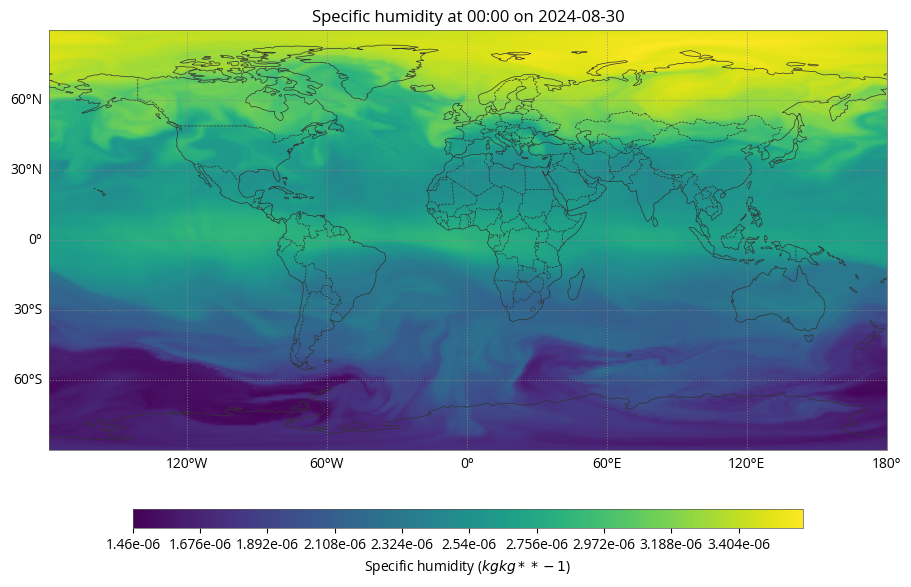

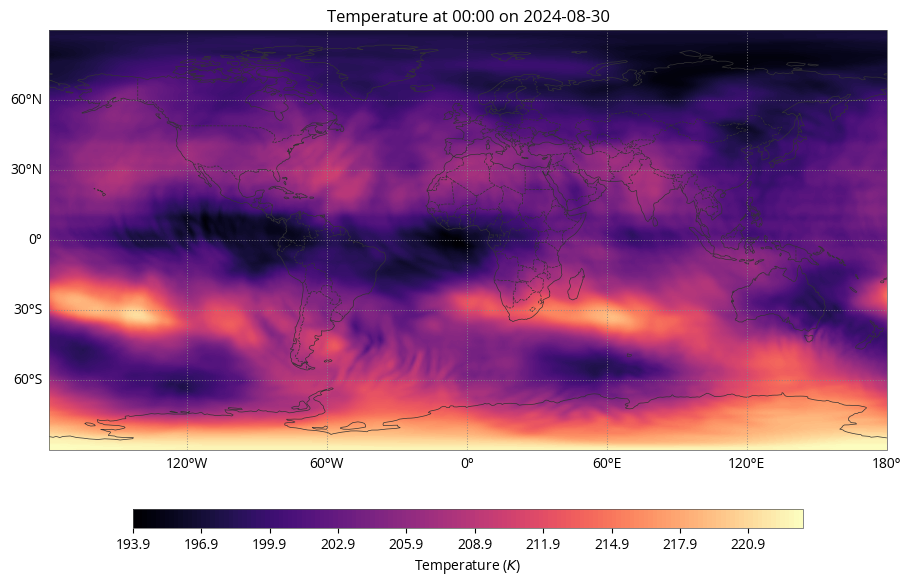

In [23]:
plot_data(da_transform)

## Plot the ZFP compression error

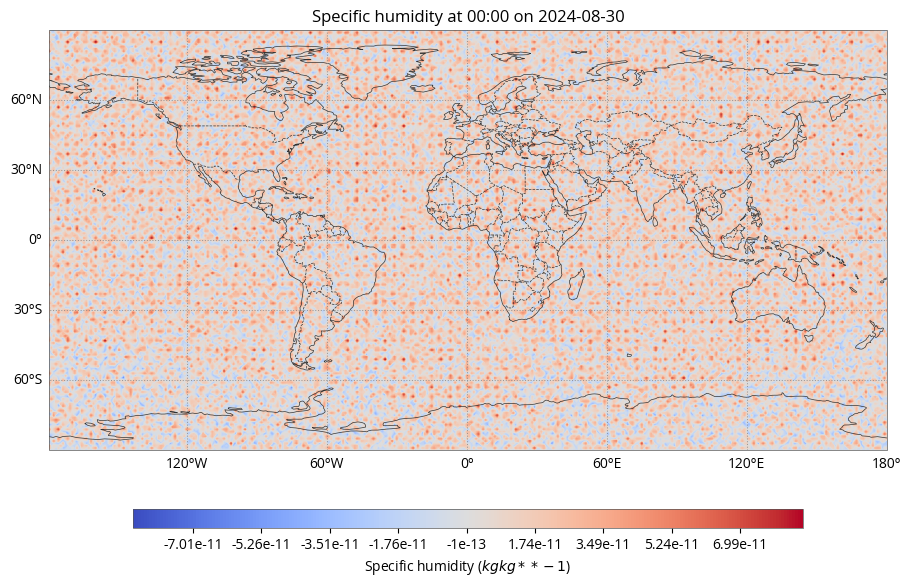

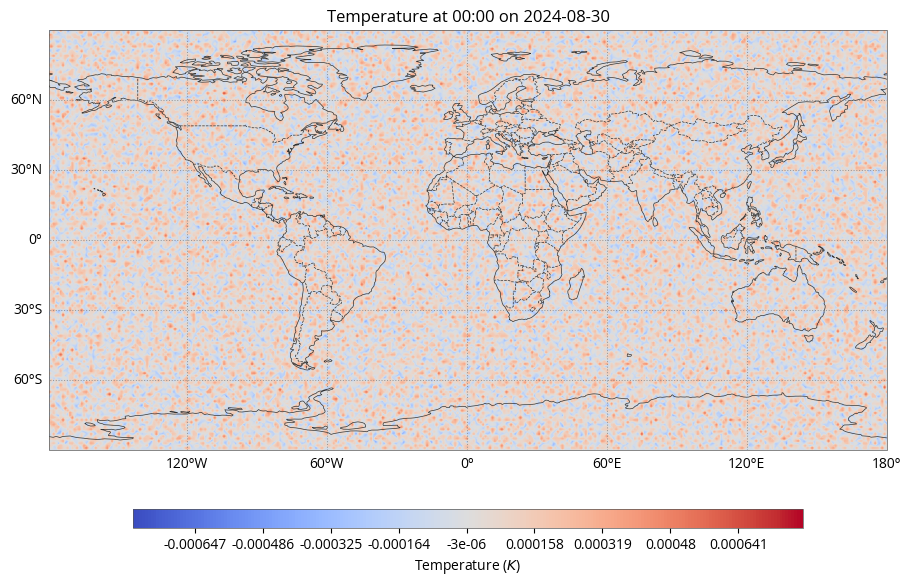

In [24]:
errors_transform = {}
da_transform_error = []
for i, d in enumerate(da):
    errors_transform[d.name] = compute_relative_errors(da_transform[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_transform_error = da_transform[d.name] - da[i]
    earthkit.maps.quickplot(da_transform_error, style=earthkit.maps.Style(
    colors="coolwarm",
    levels=earthkit.maps.styles.levels.auto_range(da_transform_error, n_levels=256, divergence_point=0.0),

));

    

## Run the prediction-based SZ3 compressor

SZ3 is a lossy prediction-based compressor that compresses multidimensional data by predicting the next value based on an indentified pattern. The quantized prediction errors are stored alongside the pattern. SZ3 is a modular compression pipeline that combines a data preprocessor, predictor, quantizer, encoder, and lossless compressor. The compression error can be bounded with absolute, relative, and PWR error bounds.

You can find out more about the SZ3 compressor in the following publications:

> Liang, X. et *al*. (2023). SZ3: A modular framework for composing prediction-based error-bounded lossy compressors. *IEEE Transactions on Big Data*. 9(2). pp. 485-498. Available from: [doi:10.1109/TBDATA.2022.3201176](https://doi.org/10.1109/TBDATA.2022.3201176).

> Zhao, K. et *al*. (2021). Optimizing Error-Bounded Lossy Compression for Scientiﬁc Data by Dynamic Spline Interpolation. In: *Proceeding of the 37th IEEE International Conference on Data Engineering*. pp. 1643-1654. Available from: [doi:10.1109/ICDE51399.2021.00145](https://doi.org/10.1109/ICDE51399.2021.00145).

> Liang, X. et *al*. (2018). Error-Controlled Lossy Compression Optimized for High Compression Ratios of Scientific Datasets. *IEEE International Conference on Big Data*. pp. 438-447. Available from: [doi:10.1109/BigData.2018.8622520](https://doi.org/10.1109/BigData.2018.8622520).

In [25]:
predict_compressor = []
da_predict = {}
stats_predict = {}

for i, d in enumerate(da):
    predict_compressor.append([fcbench.codecs.Sz3(eb_mode="rel", eb_rel=10e-3)])
    da_predict[d.name], stats_predict[d.name] = fcbench.compressor.compute_dataarray_compress_decompress(d, predict_compressor[i])
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats([predict_compressor[i]], stats_predict[d.name]))

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"[Sz3(eb_mode='rel', eb_rel=0.01)]",32.65,0.04,0.16,14.7,3.4


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
"[Sz3(eb_mode='rel', eb_rel=0.01)]",40.35,0.04,0.19,15.1,3.4


In [26]:
del predict_compressor

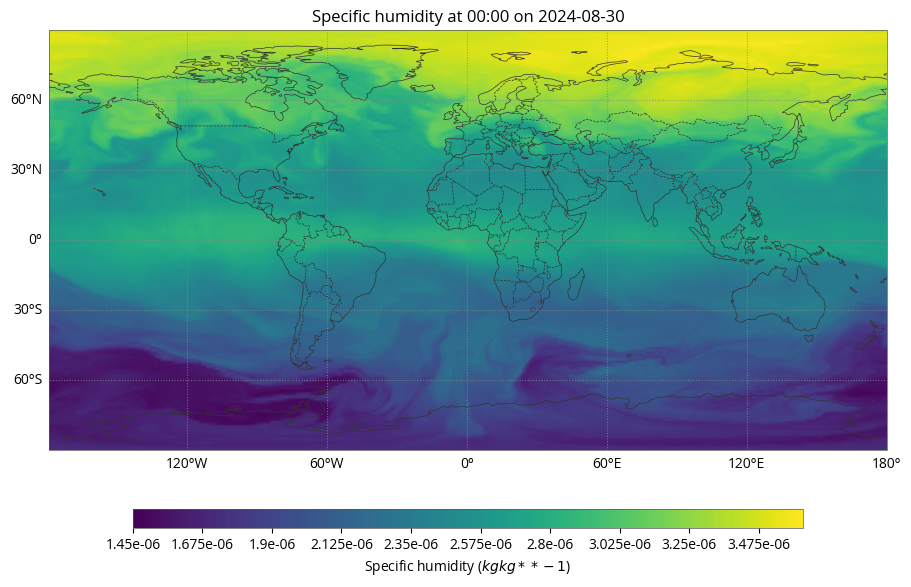

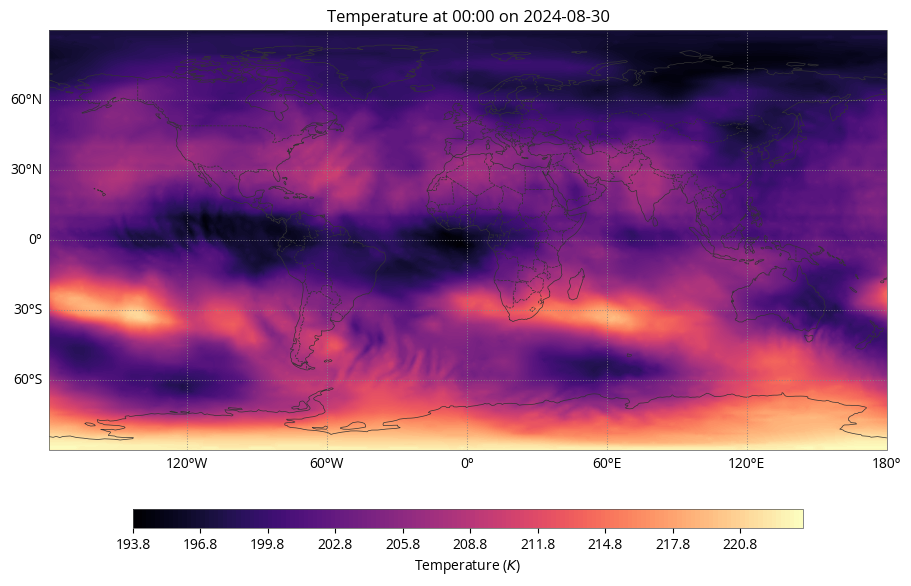

In [27]:
plot_data(da_predict)


## Plot the SZ3 compression error

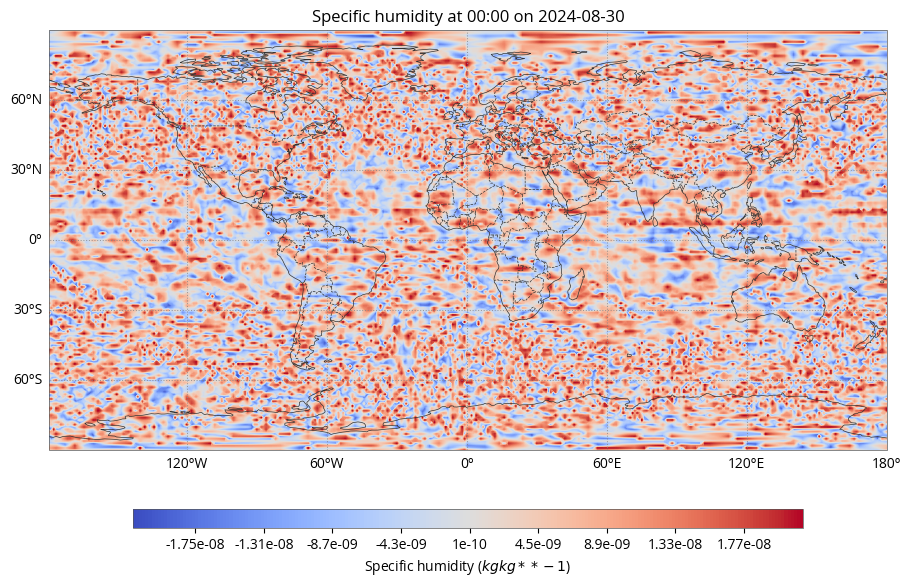

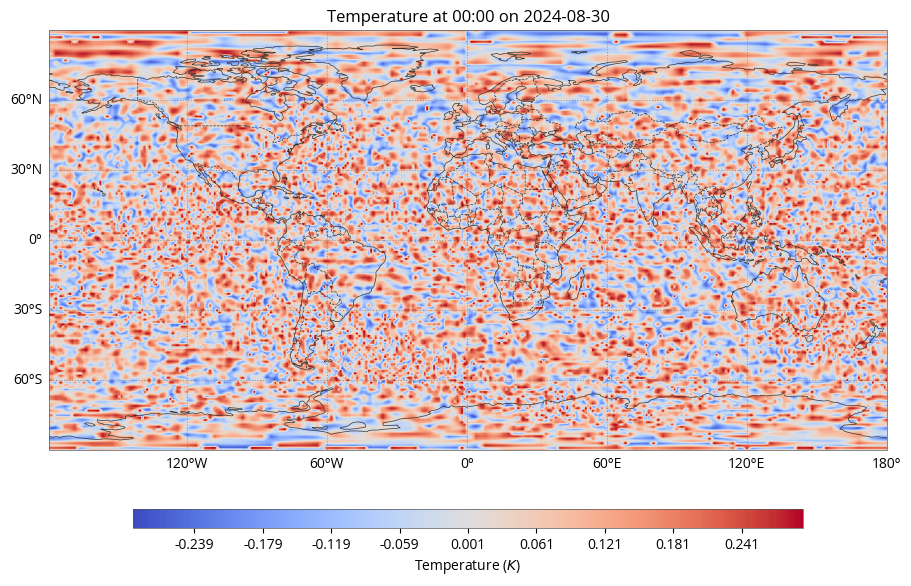

In [28]:
errors_predict = {}
da_predict_error = []
for i, d in enumerate(da):
    errors_predict[d.name] = compute_relative_errors(da_predict[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_predict_error = da_predict[d.name] - da[i]
    earthkit.maps.quickplot(da_predict_error, style=earthkit.maps.Style(
    colors="coolwarm",
    levels=earthkit.maps.styles.levels.auto_range(da_predict_error, n_levels=256, divergence_point=0.0),

));

## Run the BitRound compressor



In [29]:
rounding_compressor = []
da_rounding = {}
stats_rounding = {}

for i, d in enumerate(da):
    rounding_compressor.append([fcbench.codecs.BitRound(keepbits=6)])
    da_rounding[d.name], stats_rounding[d.name] = fcbench.compressor.compute_dataarray_compress_decompress(d, rounding_compressor[i])
    print(f"{da[i].long_name}" + ":")
    display(utils.format_compress_stats([rounding_compressor[i]], stats_rounding[d.name]))

Specific humidity:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
[BitRound(keepbits=6)],1.0,0.06,0.27,0.1,0.0


Temperature:


,compression ratio [raw B / enc B],encode throughput [raw GB/s],decode throughput [raw GB/s],encode instructions [#/B],decode instructions [#/B]
Codec,,,,,
[BitRound(keepbits=6)],1.0,0.31,0.72,0.1,0.0


In [30]:
del rounding_compressor

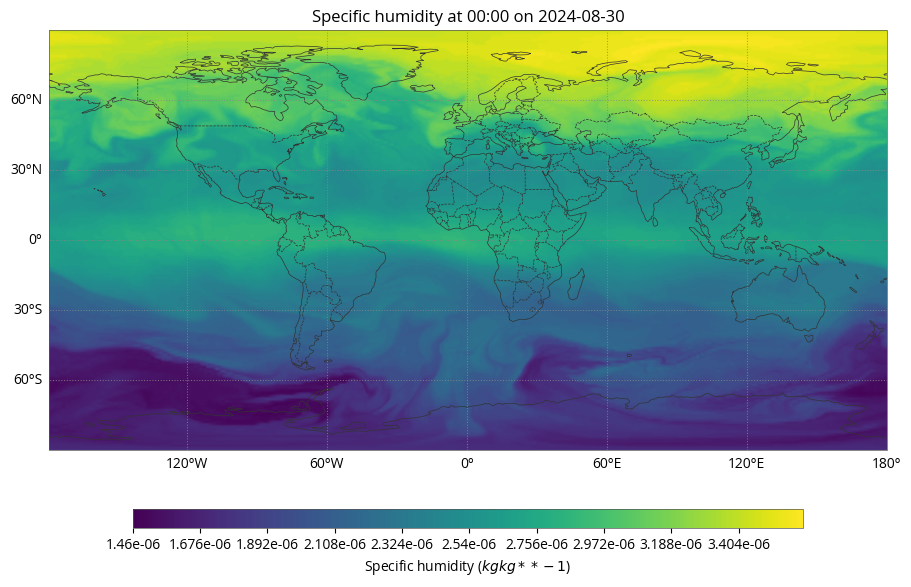

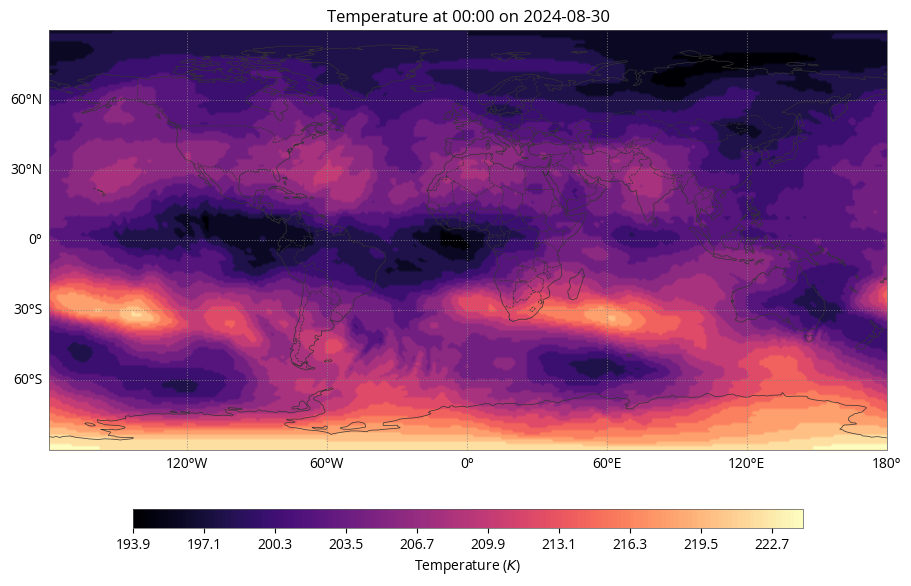

In [31]:
plot_data(da_rounding)

## Plot the BitRound compression error

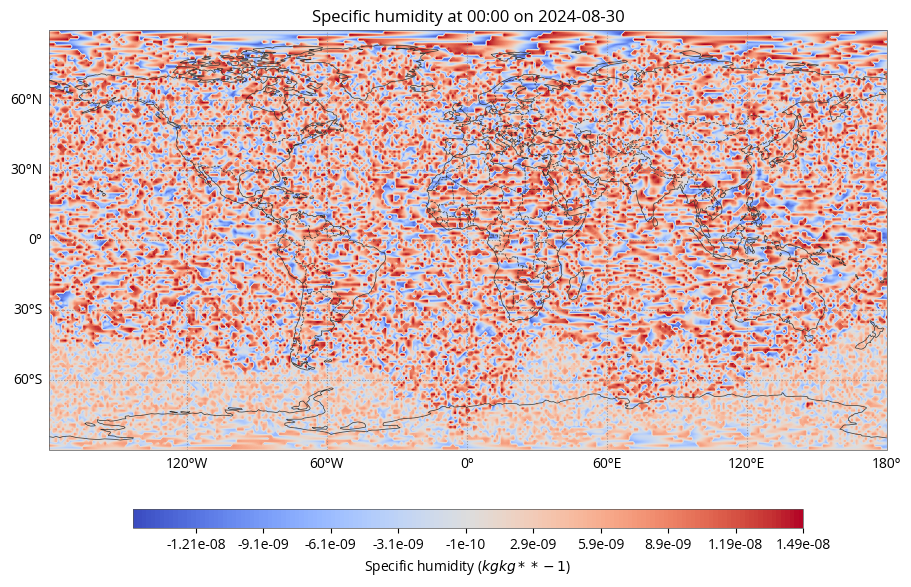

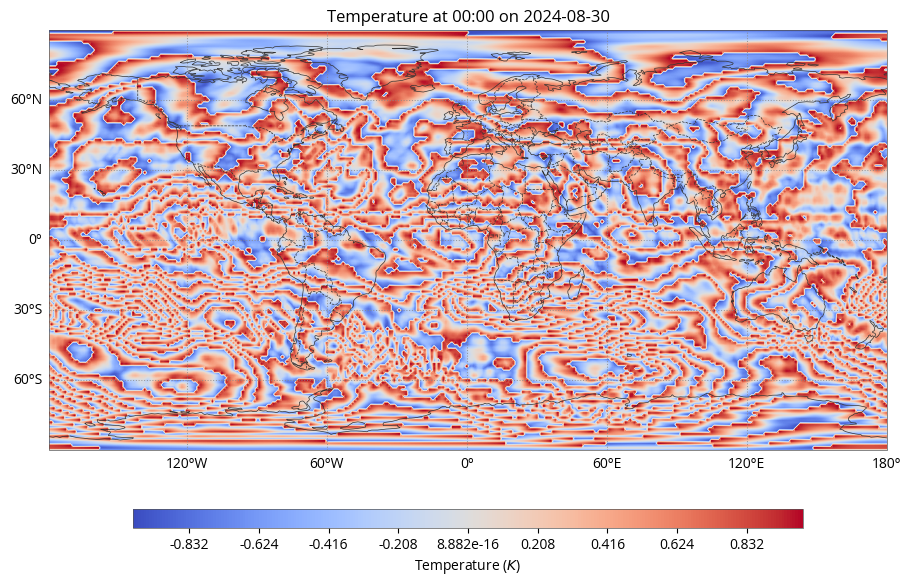

In [32]:
errors_rounding = {}
da_rounding_error = []
for i, d in enumerate(da):
    errors_rounding[d.name] = compute_relative_errors(da_rounding[d.name], da[i])
    with xr.set_options(keep_attrs=True):
        da_rounding_error = da_rounding[d.name] - da[i]
    earthkit.maps.quickplot(da_rounding_error, style=earthkit.maps.Style(
    colors="coolwarm",
    levels=earthkit.maps.styles.levels.auto_range(da_rounding_error, n_levels=256, divergence_point=0.0),

));

## Overview 

Here you get an overview table showing the used compressors, compression factors and resulting $L^1$, $L^2$ and $L^\infty$ errors.

In [33]:
import pandas as pd
data = []

compressors = {
    'Linear Quantization': (errors_simple, stats_simple),
    'transform-based ZFP': (errors_transform, stats_transform),
    'SZ3': (errors_predict, stats_predict),
    'Bit Round': (errors_rounding, stats_rounding)
}

for compressor_name, (errors, stats) in compressors.items():
    for variable, error_data in errors.items():
        stats_table = utils.format_compress_stats([compressor_name], [stats[variable][0]])

        row = {
            'Compressor': compressor_name,
            'Variable': variable,
            'Compression Ratio [raw B / enc B]': stats_table.loc[compressor_name, 'compression ratio [raw B / enc B]'],
            'encode instructions [#/B]': stats_table.loc[compressor_name, 'encode instructions [#/B]'],
            'decode instructions [#/B]': stats_table.loc[compressor_name, 'decode instructions [#/B]'],
            'encode throughput [raw GB/s]]': stats_table.loc[compressor_name, 'encode throughput [raw GB/s]'],
            'decode throughput [raw GB/s]': stats_table.loc[compressor_name, 'decode throughput [raw GB/s]'],
            'L1 Error': error_data.get('Relative_Error_L1', None),
            'L2 Error': error_data.get('Relative_Error_L2', None),
            'Linf Error': error_data.get('Relative_Error_Linf', None),
        }
        data.append(row)




df = pd.DataFrame(data)

display(df)


,Compressor,Variable,Compression Ratio [raw B / enc B],encode instructions [#/B],decode instructions [#/B],encode throughput [raw GB/s]],decode throughput [raw GB/s],L1 Error,L2 Error,Linf Error
0,Linear Quantization,q,4.00,6.4,2.0,0.05,0.19,2.897449e-02,3.239692e-02,0.039677
1,Linear Quantization,t,4.00,6.4,2.0,0.09,0.26,4.777529e-03,5.489164e-03,0.008722
2,transform-based ZFP,q,1.06,27.5,22.8,0.02,0.03,6.323377e-06,7.795366e-06,0.000024
3,transform-based ZFP,t,1.12,29.9,23.6,0.03,0.03,6.467062e-07,8.174433e-07,0.000004
4,SZ3,q,32.65,14.7,3.4,0.04,0.16,3.210866e-03,3.837592e-03,0.005952
5,SZ3,t,40.35,15.1,3.4,0.04,0.19,5.389258e-04,6.566495e-04,0.001308
6,Bit Round,q,1.00,0.1,0.0,0.06,0.27,2.692112e-03,3.106560e-03,0.004126
7,Bit Round,t,1.00,0.1,0.0,0.31,0.72,2.482379e-03,2.855201e-03,0.004480


## Save the dataset for further use

If you want to perform further work on the (compressed) data outside or in a new session of the compression lab, you can download the data to your computer. Note that the writes are directly streamed to the download and it is thus not possible to skip around the file (seek) or read written back during the download.

### (a) Download the compressed data

You can save the compressed dataset as a single `.zip` file in the [ZARR format](https://zarr.readthedocs.io/en/stable/spec.html). Note that this approach takes the uncompressed dataset and runs the provided compression as the dataset is downloaded.

For instance, here we download the dataset compressed using the SZ3 compressor from above. You can also download the uncompressed dataset by passing `compressor=[]` to the following helper function:
```python
await utils.download_dataset_as_zarr(
    ds: xr.Dataset,
    name: str,
    compressor: Union[
        numcodecs.abc.Codec,
        list[numcodecs.abc.Codec],
        dict[str, Union[
            numcodecs.abc.Codec,
            list[numcodecs.abc.Codec],
        ]],
    ],
    zip_compression: int = 0,
)
```

In [ ]:
from pathlib import Path

compressed_download_name = Path(ds.attrs.get("path", "ds")).name
compressed_download_name = compressed_download_name[:compressed_download_name.find('.')]
compressed_download_name = f"{compressed_download_name}-compressed.zarr.zip"
compressed_download_name

In [ ]:
await utils.download_dataset_as_zarr(ds, compressed_download_name, compressor=[fcbench.codecs.BitRound(keepbits=8)])

## Feedback on the ESiWACE3 Compression Lab

We aim to build an online compression laboratory in which you can easily test and apply the most relevant compression algorithms on your data. We want to hear from you about what your requirements for compression are to ensure that any downstream scientific analysis is not adversely affected.

Please use the below link to provide us with feedback on
- your requirements for compression
- any bugs in the compression lab
- missing features that would allow you to better use it (e.g. unsupported data formats, compression methods, or compression error analysis methods)
- complicated or unclear functionality in the compression lab

https://forms.office.com/e/hKqfmvFTkz